## Introduction
### 1. Growth
The model consists of different parts that interlock to simulate cell fate decisions. Here the basic function, cell growth, division, movement, transcription,signalling and their equations are described. Cell growth through time is represented by the following differential equation.
\begin{align}
\frac{dr}{dt} = k \cdot r \cdot(r_{max}-r)
\end{align}
Where $r$ describes the radius of the cell, $k$ the growth rate and $r_{max}$ its maximum size. By defining the equation in this way, we have also directly made the assumption - quite reasonable - that the cell cannot grow infinitely. In order to solve the equation, initial conditions have to be determined:
\begin{align}
r(t_{0})= r_{0}
\end{align}

This condition only states that the radius of cell $r$ at time $t_{0}$ is equal to the initial radius $r_{0}$, whereby $ 0<r_{0}<r_{max}$. Such a simple differential equation can be solved analytically quite well: 
\begin{align}
r(t) &= \dfrac{r_{max}}{1 + C \cdot e^{-kr_{max}(t - t_{0})}} \\
C &= \frac{r_{max} - r_{0}}{r_{0}}
\end{align}

In [1]:
using Plots,GraphRecipes
using Random, Distributions #used in cell_division
using LinearAlgebra # used in Forces
using Distances # used in Forces
using Combinatorics
using MiniQhull 

In [2]:
function cell_growth(k, t, t0, r0, r_max)

    #growth = r_max .- exp.(-k .* (t .- t0)) .*(r_max .- r0)
    #growth = r_max ./ (1 .+ ((r_max .- r0)./(r0)) .* exp.(-k * r_max * t))
    growth = r_max ./ (1 .+ ((r_max .- r0)./(r0)) .* exp.(-k * r_max .* (t .- t0)))
    return growth
end

# define parameters
k = 2 # growth rate
r_max = 1 # maximum radius
r0 = 0.1 # initial radius

# define time steps

t = range(0,5,1000)
t0 = t[1]

radius = cell_growth.(k,t,t0,r0,r_max)

p = plot(t,radius,
    xlabel="t [au]",ylabel="r [au]",
    label="radius",title="Cell growth over time",xlabelfontsize=18,ylabelfontsize=18,legendfontsize=12,titlefontsize=18,
    legend=:right)
savefig(p, "data/growth.svg")

### 2. Cell devision

The probability of a cell to divide depending on its radius is defined by:


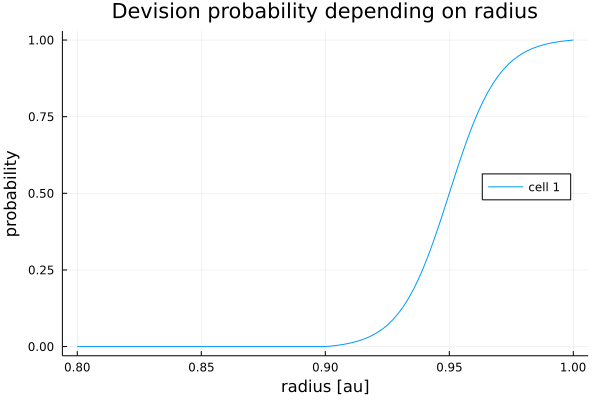

In [3]:
function division_probability(r, r_max)

    c = 100 / r_max
    y = 0.95 * r_max
    r_min = 0.9 * r_max

    b = (1 + exp(c * (r_max - y))) * (1 + exp(c * (r_min - y)))/(exp(c * (r_min - y)) - exp(c * (r_max - y)))
    a = -b/(1 + exp(c*(r_min - y)))
    P = a+b/(1 + exp(c*(r - y)))

    return maximum([0, P])
end

# define r

r_test = range(0.8,1,100)

#
prob = division_probability.(r_test,1)

plot(r_test,prob,
    xlabel="radius [au]",ylabel="probability",
    label="cell 1",title = "Devision probability depending on radius",
    legend=:right)

In [4]:
function cell_division(xy, r, r0, r_old, r_max, t, t0, Nanog, Gata, type_func=random_angle_cell_devision;func_orth = false)

    # Choose where division will randomly occur    
    p_old = division_probability.(r_old, r_max)
    p = division_probability.(r, r_max)

    prob = (p .- p_old) ./ (1 .- p_old)
    prob[r_old .== r0]  = p[r_old .== r0]

    random_numbers = rand(length(r))
    indices = findall(x -> x < 0, random_numbers - prob)


    if !isempty(indices)

         # New radius based on the area of the mother cell being two times that of the daughter cells
        r_new = r[indices]/2^(1/2)

        # distance between the two daughter cells
        distance = rand.(Normal.((r[indices] - r_new)/2,0.1*(r[indices] - r_new)/2))


        # kind of cell devision
        xy = type_func(xy, indices, r_new, distance,func_orth)



        # radii update of mothers cells and adding radii of daughter cells # do the radii really get updated this way?
        for i in range(1,length(r_new),step=1)
            push!(r, r_new[i])
            push!(r0, r_new[i])
        end
        
        # t0 update of mothers cells and adding t0 of daughter cells
        # t0 is used to calculate cell growth
        t0[indices] .= t
        for i in range(1,length(t0[indices]),step=1)
            push!(t0, t0[indices[i]])
        end
        
        if !isempty(Nanog)
            # G update of mothers cells and adding t0 of daughter cells
            # G is used to calculate cell growth
            Gata[indices] .= Gata[indices]/2
            for i in range(1,length(Gata[indices]),step=1)
                push!(Gata, Gata[indices[i]]/2)
            end

            # N update of mothers cells and adding t0 of daughter cells
            # N is used to calculate cell growth
            Nanog[indices] .= Nanog[indices]/2
            for i in range(1,length(Nanog[indices]),step=1)
                push!(Nanog, Nanog[indices[i]]/2)
            end
        end
    end

    return xy, r, r0 ,t0, Nanog, Gata
end

function random_angle_cell_devision(xy,indices,r_new,distance,orth = false)

    # angle_value of cell division
    angle_value = rand(length(r_new))*2*π

    # displacement vectors
    dx = distance .* cos.(angle_value)
    dy = distance .* sin.(angle_value)

    # displacement
    dxy = [dx;dy]
    dxy = reshape(dxy,(2,Int(length(dxy)/2))) 
    xy1 = xy[indices,:] + dxy'
    xy2 = xy[indices,:] - dxy'

    # position update of mother cells
    xy[indices,:] = xy1

    # adding positions of daughter cells
    xy = vcat(xy,xy2)

    return xy

end

random_angle_cell_devision (generic function with 2 methods)

Testing cell devision for 1 time step

In [5]:
### initial conditions ###

xy = ([-0.1 0; 0.1 0; 0.05 0.05])
r = [0.95, 0.97, 0.9]
r_old = [0.92, 0.95, 0.8]
r0 = [0.5, 0.5, 0.5]
r_max = 1 
t = 1
t0 = zeros(length(r0))


Nanog = []
Gata = []
xy_neu,r_neu,r0_neu,t0_neu,Nanog_neu,Gata_neu = cell_division(xy, r, r0, r_old, r_max, t, t0, Nanog, Gata,random_angle_cell_devision);

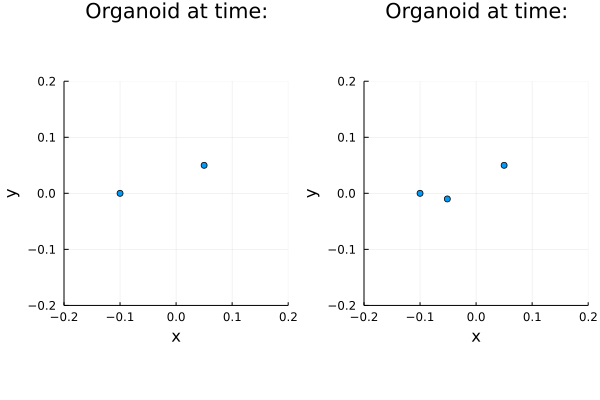

In [6]:
p1 = scatter(xy[:,1],xy[:,2],label="",xlabel="x",ylabel="y",aspect_ratio=:equal,title = "Organoid at time:",xlim=(-0.2,0.2),ylim=(-0.2,0.2))
p2 = scatter(xy_neu[:,1],xy_neu[:,2],label="",xlabel="x",ylabel="y",aspect_ratio=:equal,title = "Organoid at time:",xlim=(-0.2,0.2),ylim=(-0.2,0.2))
plot(p1,p2, layout=(1,2),legend=false)

### 3. Displacement

The cell position of cell $i$ changes depending on the sum of the forces $F_{ij}$ acting on each cell and random movement $B_{i}$
\begin{align}
\frac{dx_i}{dt} = \sum_{j \neq i} F_{ij} + B_{i}.
\end{align}
For simplicity the random movement is kept at $B_{i} = 0$. The force in this special case is given by the derivative of the Morse potential
\begin{align}
F_{ij} = 2 F_0 \left(e^{-\alpha(||x_i-x_j|| - \sigma(r_i+r_j))} - e^{-2\alpha(||x_i-x_j|| - \sigma(r_i+r_j))}\right)\frac{x_i - x_j}{||x_i - x_j||}.
\end{align}
α describes the stiffness of the cells, whereas σ ∈ (0, 1] defines the optimal distance
between two cells in contact as a fraction of the sum of their radii. 

In [7]:

function forces(xy, r, F0, alpha, sigma)
    # alpha is the stiffness
    # sigma determines where the cells are ideally positioned in terms of their radii
    # F0 is a scaling factor
    distance = pairwise(Euclidean(),xy, dims = 1)

    r_pairwise = r' .+ r
    x_pairwise = xy[:,1]' .- xy[:,1]
    y_pairwise = xy[:,2]' .- xy[:,2]
    
    # Absolute values of forces according to Morse potential
    F = F0*2*alpha*(exp.(-2*alpha*(distance-r_pairwise*sigma)) - exp.(-alpha*(distance-r_pairwise*sigma)))
    #F[dist > r_pairwise] = 0

    # Fill distance matrix with inf on diagonal
    distance[diagind(distance)].=Inf32

    # x- and y-direction of forces
    Fx = F.*(x_pairwise)./distance
    Fy = F.*(y_pairwise)./distance

    # Sum of all forces acting on each cell as a vector
    force = hcat(sum(Fx, dims = 2),sum(Fy, dims = 2))
    
return (force)
end 

function displacement(xy, r, dt, F0, alpha, sigma)

    F = forces(xy, r, F0, alpha, sigma)
    xy = xy - dt*F

    return xy
end

displacement (generic function with 1 method)

#### Testing displacement for 3 cells

┌ Info: Saved animation to 
│   fn = C:\Users\Sascha\AppData\Local\Temp\jl_HB8vHba6UB.gif
└ @ Plots C:\Users\Sascha\.julia\packages\Plots\1KWPG\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\Sascha\\AppData\\Local\\Temp\\jl_HB8vHba6UB.gif")
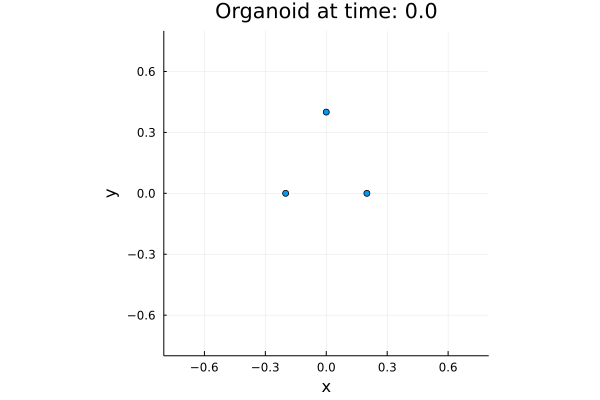

In [8]:
### Set parameters ###
alpha = 3                # cell stiffness  
sigma = 0.7              # Optimal distance between cells
F0 = 0.1                 # Force scaling

T = 1                   # End time    
N = 200                 # Number of timesteps
t = collect(range(0,T,length=N))   # Time at each timestep
dt = t[2]-t[1]           # timestep


### Initial conditions ###
xy = ([-0.2 0; 0.2 0; 0. 0.4]) # cell positions
r = [0.4, 0.5, 0.7] # cell radii


displ_matrix = zeros(N+1,3,2) # create matrix for data storage to access later
displ_matrix[1,:,:] = xy # push initial conditions 

a =Animation()
for i in range(1,N,step=1)
    
    ### steps plotting ###
    p = scatter(xy[:,1],xy[:,2],label="",xlabel="x",ylabel="y",aspect_ratio=:equal,title = "Organoid at time: " * string(round(t[i],digits=1)),xlim=(-0.8,0.8),ylim=(-0.8,0.8))

    ### physics simulation ###
    xy = displacement(xy, r, dt, F0, alpha, sigma)

    ### data storage ###
    displ_matrix[i+1,:,:] = xy 

    ### frame for gif ###
    frame(a,p)

end

gif(a)

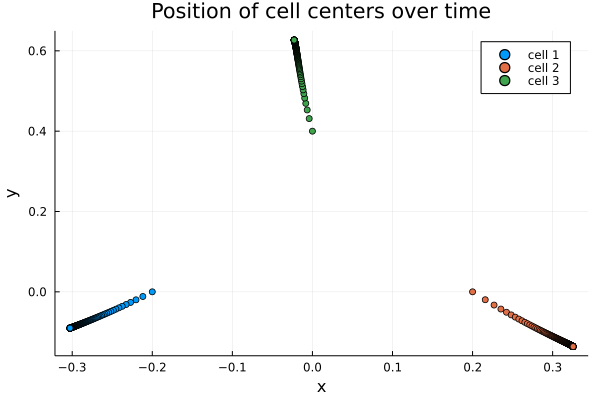

In [9]:
p = scatter(displ_matrix[:,1,1],displ_matrix[:,1,2],label = "cell 1",xlabel="x",ylabel="y",
title ="Position of cell centers over time")
scatter!(displ_matrix[:,2,1],displ_matrix[:,2,2],label = "cell 2")
scatter!(displ_matrix[:,3,1],displ_matrix[:,3,2],label = "cell 3")


In [6]:
alpha = 2                # cell stiffness  
sigma = 0.5              # Optimal distance between cells
F0 = 1                 # Force scaling
distance = range(0.001,3,100)
F(distance) = F0*2*alpha*(exp.(-2*alpha*(distance-1*sigma)) - exp.(-alpha*(distance-1*sigma)))
p = plot(distance,F,yrange=(-3,3),label="F",xlabel="distance [r]",ylabel="F [au]",title="Forces between two cells",
titlefontsize=18,xguidefontsize=18,yguidefontsize=18,legendfontsize=12,linewidth=2)
hline!([0,0],color="gray",label="")
savefig(p,"D:/data/plots/Force/no_adhesion.svg")

"D:\\data\\plots\\Force\\no_adhesion.svg"

In [ ]:

sigma = 0.7
alpha = 2
beta = 1.0
F0 = 0.6
distance = range(0.001,3,100)


u = [1,1]
v = [0,0]
eta_a = ((u[1] + v[1]) * (u[2] + v[2]))/(v[1] + v[2] + beta) + 1/beta
F(distance) = F0*2*alpha*(exp.(-2*alpha*(distance-1*sigma)) .-eta_a* exp.(-alpha*(distance-1*sigma)))
p = plot(distance,F,yrange=(-3,3),label="UU",xlabel="distance [r]",ylabel="Fsort [au]",title="Force including adhesion",
    titlefontsize=18,xguidefontsize=18,yguidefontsize=18,legendfontsize=12,linewidth=2)

u = [0,1]
v = [1,0]
eta_a = ((u[1] + v[1]) * (u[2] + v[2]))/(v[1] + v[2] + beta) + 1/beta
F(distance) = F0*2*alpha*(exp.(-2*alpha*(distance-1*sigma)) .-eta_a* exp.(-alpha*(distance-1*sigma)))
plot!(distance,F,yrange=(-3,3),label="UV",xlabel="distance [r]",xguidefontsize=18,yguidefontsize=18,linewidth=2)


u = [0,0]
v = [1,1]
eta_a = ((u[1] + v[1]) * (u[2] + v[2]))/(v[1] + v[2] + beta) + 1/beta
F(distance) = F0*2*alpha*(exp.(-2*alpha*(distance-1*sigma)) .-eta_a* exp.(-alpha*(distance-1*sigma)))
plot!(distance,F,yrange=(-3,3),label="VV",xlabel="distance [r]",xguidefontsize=18,yguidefontsize=18,linewidth=2)
hline!([0,0],color="gray",label="")
#savefig(p,"D:/data/plots/Force/beta_1_nice.svg")


"D:\\data\\plots\\Force\\beta_1_nice.svg"

### 4. Transcription and signalling


#### Transcription
The production of two transcription factors $U,V$ in a cell $i$ depending on each other a signal $S$ from outside can be described by the following set of differential equations, which are derived from statistical thermodynamics. (For further inside see: LINK einfügen) 
\begin{align}
\frac{dU_{i}}{dt} &= r_{U}\frac{\eta_{U}U_{i}}{1 + \eta_{V} \cdot V_{i}(1 + \eta_{s}\eta{_VS} \cdot S_{i}) + \eta_{U}U_{i} + \eta_{s}S_{i}} - \gamma_{U}U_{i} \\
\frac{dV_{i}}{dt} &= r_{V}\frac{\eta_{V}V_{i}(1 + \eta_{s}\eta{_VS} \cdot S_{i})}{1 + \eta_{V} \cdot V_{i}(1 + \eta_{s}\eta{_VS} \cdot S_{i}) + \eta_{U}U_{i} + \eta_{s}S_{i}} - \gamma_{V}V_{i}
\end{align}
$\eta_{x}$ is the energy coefficient of the transcription factor $x$. $\gamma_{x}$ and $r_{x}$ are the decay and growth rates of $x$, respectively. 


#### Signalling
The signal can be modelled in different ways, here two options are used the average nearest neighbour signalling and a distance based global signalling. The first options is given by
\begin{align}
S_{i} = \frac{1}{|N_{G}(i)|}\sum_{j \in N_{G}(i)}^{}  U_{j}
\end{align}
$N_{G}(i)$ are all neighbouring cells of cell $i$.
When assuming a linear dependency from S on u the S is given by

\begin{align}
S(U) = A \cdot U
\end{align}

where A is the adjacency matrix of the cell graph. The distance based signal is defined as the weighted sum of signals over all cells. The signal is scaled by the weight $q^{d_{ij}-1}$.

\begin{align}
S_{i} = \sum_{j \neq i}^{} U_{j}q^{d_{ij}-1} \cdot \frac{1}{\max_{k} \sum_{j \neq k}^{} q^{d_{kj}-1}}, 
\end{align}

with   $q \in (0,1]$. For $q = 0$ the signal is equal to the nearest neighbour signal and for $q = 1$ there is no scaling of the signals regarding to the distance $d_{ij}$ between the cells. 

In [10]:
function matrix_from_delaunay(connectivity,xy,r;check_distance = false)
    m = zeros(length(xy[1,:]),length(xy[1,:])) # define graph with number of notes as cells and no edges
    for k in 1:length(connectivity[1,:])    # iterate over all triangles from delaunay tesselation
        # get all edges of one triangle:
        edge_list = combinations(connectivity[:,k],2) |>collect # same as collect(combinations(connectivity[:,k],2))

        if check_distance # check if distance between to points is greater than the sum of their radii
            for i in 1:length(edge_list)    # iterate over all edges
                if euclidean(xy[edge_list[i][1]],xy[edge_list[i][2]]) < (r[edge_list[i][1]] + r[edge_list[i][2]])*2
                    m[edge_list[i][1],edge_list[i][2]] = 1    # add edges to graph
                    m[edge_list[i][2],edge_list[i][1]] = 1 
                end
            end
        else
            for i in 1:length(edge_list)    # iterate over all edges
                m[edge_list[i][1],edge_list[i][2]] = 1    # add edges to graph
                m[edge_list[i][2],edge_list[i][1]] = 1 
            end
        end
    end
return(m)
end



function transcription(N,G,S,p) 
   
       a = exp(-p["eps_G"])
       b = exp(-p["eps_N"])
       c = exp(-p["eps_S"])
       d = exp(-p["eps_GS"])
   
       #S = np.dot(A, N)
   
       pN =        (b*N)       ./ (1 .+ a*G .* (1 .+ d*c*S) + b*N + c*S)
       pG = (a*G) .* (1 .+ d*c*S) ./ (1 .+ a*G .* (1 .+ d*c*S) + b*N + c*S)
                           
       N = N .+ p["tau"] * dt .* (p["r_N"]*pN - p["Gamma_N"]*N)
       G = G .+ p["tau"] * dt .* (p["r_G"]*pG - p["Gamma_G"]*G)
   
       return N,G
   end


transcription (generic function with 1 method)

#### Some other helpful functions

In [ ]:
### Data handling, plotting###

function transform_data_to_matrix(data)
    results_matrix = Array{Union{Missing, Float64}}(missing,(length(data),length(data[end])))
    for j in range(1,length(data))
        for i in range(1,length(data[j]))
            results_matrix[j,i] = data[j][i]
        end 
    end
    return results_matrix
end


function draw_edges_from_matrix!(matrix,xy)
    # matrix = connectivity_matrix xy = cell positions
    for k in range(1,length(matrix[1,:])) # iterate over matrix
        for i in range(1,k-1)
            if matrix[k,i] == 1 # if cells i and k are connected, a line is drawn between their positions
                a = [xy[i,1],xy[k,1]]
                b = [xy[i,2],xy[k,2]]
                plot!(a,b,label="",alpha= 0.4,color="gray")
            end
        end
    end
end

#### Testing transcription for 2 cells

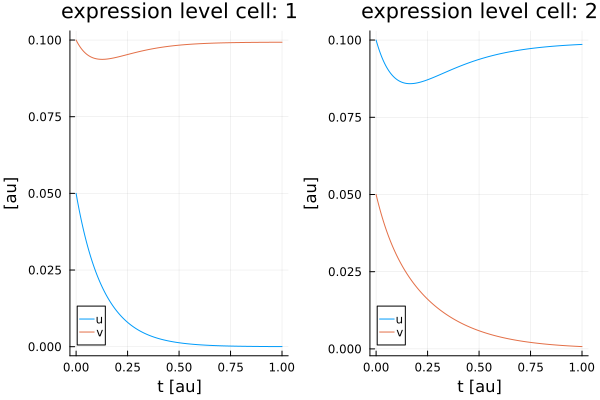

In [60]:
T = 1                   # End time    
N = 200                 # Number of timesteps
t = collect(range(0,T,length=N))   # Time at each timestep
dt = t[2]-t[1]           # timestep

### transcription paramater ###
par = Dict(
    "eps_G" => -6,
    "eps_N" => -7.32,
    "eps_S" => -2,
    "eps_GS" => -2,
    "tau" => 1,
    "r_N" => 1,
    "r_G" =>1,
    "Gamma_N" => 10,
    "Gamma_G" => 10
)

### Initial conditions ###
U = [0.1,0.05] # cell positions
V = [0.05,0.1]

matrix = [0 1 ; 1 0] #  adjendency matrix used for signalling


time_u = []
time_v = []
#displ_matrix = zeros(N+1,3,2) # create matrix for data storage to access later
#displ_matrix[1,:,:] = xy # push initial conditions 

for i in range(1,N,step=1)

    ### get signal depending on expression of U ###
    S = [] 
    for i in range(1,length(U))
        push!(S,dot(Nanog,matrix[i,:])) #nearest neighbour signalling
    end

    ### save expression data###
    push!(time_u,U)
    push!(time_v, V)

    ### transcription ###
    U,V = transcription(U,V,S,par)
    
end

data_n_matrix = transform_data_to_matrix(time_u)
data_g_matrix = transform_data_to_matrix(time_v)


p3 = plot(t,data_g_matrix[:,1],label="u",title="expression level cell: " * string(1),xlabel="t [au]",ylabel="[au]")
 plot!(t,data_n_matrix[:,1],label="v")

p4 = plot(t,data_g_matrix[:,2],label="u",title="expression level cell: " * string(2),xlabel="t [au]",ylabel="[au]")
plot!(t,data_n_matrix[:,2],label="v")

plot(p3,p4, layout=(1,2),legend=true)

### 5. Combining everything

##


##


##


##

┌ Info: Saved animation to C:\Users\sao27je\AppData\Local\Temp\jl_XMBqnobI7O.gif
└ @ Plots C:\Users\sao27je\.julia\packages\Plots\QWCV6\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\sao27je\\AppData\\Local\\Temp\\jl_XMBqnobI7O.gif")
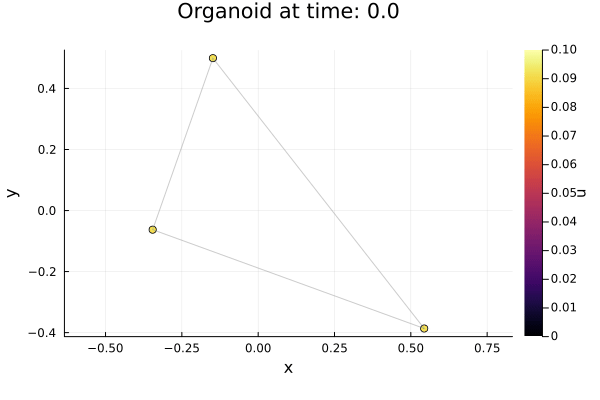

In [65]:
alpha = 3                # cell stiffness  
sigma = 0.7              # weird stuff
F0 = 0.1                 # Force scaling
r_max = 1                # Maximum radius
k = 0.5                  # Cell growth rate

T = 15                    # Time
N = 1500                 # Number of timesteps
t = collect(range(0,T,length=N))   # Time at each timestep
dt = t[2]-t[1]           # timestep needs to fulfill:  0 < dt << 1

### Paramater transcription ###
par = Dict(
    "eps_G" => -6,
    "eps_N" => -7.32,
    "eps_S" => -2,
    "eps_GS" => -2,
    "tau" => 1,
    "r_N" => 1,
    "r_G" =>1,
    "Gamma_N" => 10,
    "Gamma_G" => 10
)

### Initial conditions ###
xy = ([-0.1 0; 0.1 0; 0.05 0.05])
r = [0.4, 0.5, 0.7]
Gata = [0.1, 0.1,0.1]
Nanog = [0.1, 0.1,0.1]

r0 = r
t0 = zeros(length(r))


time_n =[]
time_g =[]

a =Animation()


for i in range(1,N,step=1)

    ### physics simulation ###
    r_old = r
    r = cell_growth(k, t[i], t0, r0, r_max)
    xy, r, r0, t0, Nanog, Gata = cell_division(xy, r, r0, r_old, r_max, t[i], t0, Nanog, Gata, random_angle_cell_devision)
    xy = displacement(xy, r, dt, F0, alpha, sigma)

    ### get neighbourhood from delaunay triangulation ###
    connectivity = delaunay(xy')
    matrix = matrix_from_delaunay(connectivity,xy',r,check_distance=false)
    

    ###  basic nearest neighbour signalling ###
    S = []
    for i in range(1,length(Nanog))
        push!(S,dot(Nanog,matrix[i,:])) 
    end

    ### transcription ###
    Nanog,Gata = transcription(Nanog,Gata,S,par)

    ### remembering transcription data###
    push!(time_n, Nanog)
    push!(time_g, Gata)


    ### plotting ### 
    # cell positions with transcription as color scale
    p = scatter(xy[:,1],xy[:,2],label="",xlabel="x",ylabel="y",aspect_ratio=:equal,marker_z=Nanog,clim = (0, 0.1),
        title = "Organoid at time: " * string(round(t[i],digits=1)),colorbar_title="u")

    # cell neighbourhood as edges
    draw_edges_from_matrix!(matrix,xy)

    # make a frame for Animation
    frame(a,p)

    if i in Int.(N .* [0.2,0.4,0.6,0.8])      # printing "##" for every 20 percent done in the simulation   
        println("##")
        
    end
end



gif(a)

it is possible to track all different quantities in the system. As example the expression level of all cells:

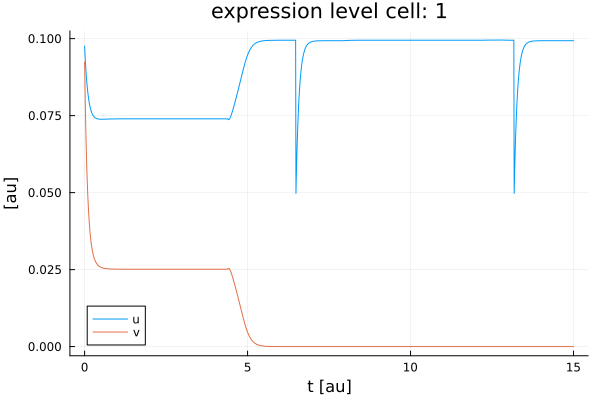

In [67]:
data_n_matrix = transform_data_to_matrix(time_n) # transforms data to make it more accesible for plotting
data_g_matrix = transform_data_to_matrix(time_g)

cell_number = 1 # data of which cell to plot

p1= plot(t,data_g_matrix[:,cell_number],label="u",title="expression level cell: " * string(cell_number),xlabel="t [au]",ylabel="[au]")
 plot!(t,data_n_matrix[:,cell_number],label="v")

The expression level of U,V in cell 1. Downward peaks usually mark events of cell devision in this cell.